In [1]:
!pip install ultralytics --upgrade -q

# Download an example image (or upload your own)
!mkdir -p images
!wget -q -O images/dog.jpg https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/dog.jpg


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 23.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 38.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 34.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 42.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 87.1 MB/s eta 0:00:00


In [38]:
from ultralytics import FastSAM
import matplotlib.pyplot as plt
import cv2, torch

# Load model
model = FastSAM('/content/FastSAM-x.pt')  # Replace with 'FastSAM-s.pt' if you're using the smaller one


image 1/1 /content/ex1.jpg: 608x1024 34 objects, 7771.2ms
Speed: 8.9ms preprocess, 7771.2ms inference, 441.0ms postprocess per image at shape (1, 3, 608, 1024)


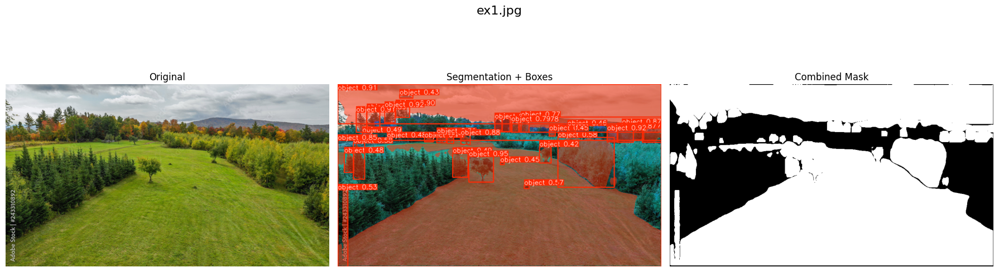


image 1/1 /content/ex2.jpg: 576x1024 14 objects, 7908.2ms
Speed: 12.5ms preprocess, 7908.2ms inference, 125.7ms postprocess per image at shape (1, 3, 576, 1024)


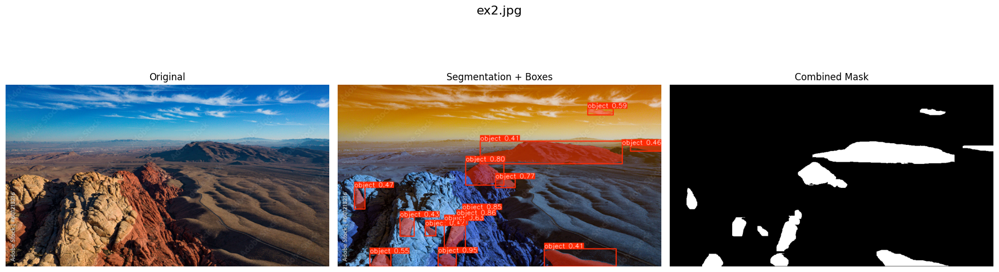


image 1/1 /content/ex3.jpg: 608x1024 33 objects, 9527.0ms
Speed: 9.8ms preprocess, 9527.0ms inference, 411.9ms postprocess per image at shape (1, 3, 608, 1024)


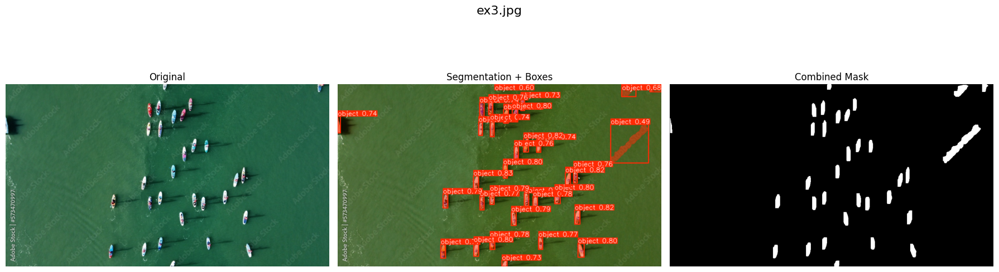


image 1/1 /content/ex4.jpg: 768x1024 262 objects, 12123.9ms
Speed: 14.9ms preprocess, 12123.9ms inference, 9832.2ms postprocess per image at shape (1, 3, 768, 1024)


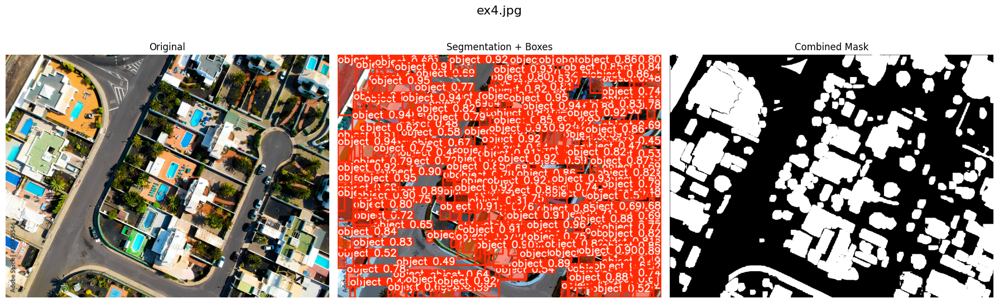


image 1/1 /content/ex5.jpg: 608x1024 118 objects, 7818.8ms
Speed: 20.8ms preprocess, 7818.8ms inference, 1567.3ms postprocess per image at shape (1, 3, 608, 1024)


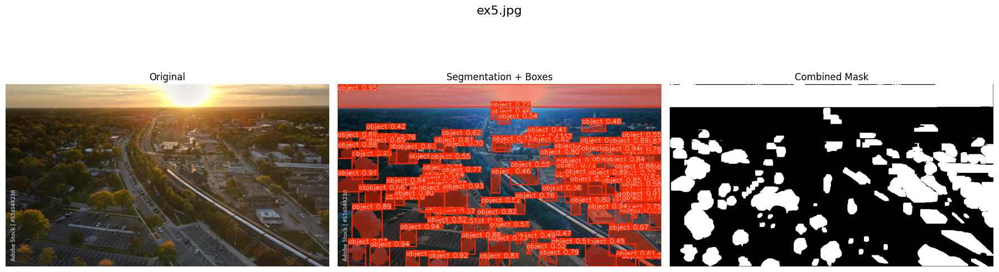

In [47]:
import os
import cv2
import torch
import numpy as np

# 👇 Folder containing your images (change this if needed)
image_folder = "/content/"
image_files = [f for f in os.listdir(image_folder) if f.lower().endswith((".jpg", ".png")) and f.startswith("ex")]

# 🎯 Process and display
for fname in sorted(image_files):
    img_path = os.path.join(image_folder, fname)
    img = cv2.imread(img_path)
    if img is None:
        print(f"❌ Failed to load {fname}, skipping.")
        continue
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # 🔍 Predict
    results = model.predict(
        source=img_path,
        imgsz=1024,
        retina_masks=True,
        conf=0.4,
        iou=0.9,
        device='cuda' if torch.cuda.is_available() else 'cpu'
    )

    r = results[0]
    masks = r.masks.data  # [N, H, W]
    combined_mask = torch.any(masks, dim=0).cpu().numpy()
    seg_img = r.plot()

    # 🎨 Display in 3-column row
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    axes[0].imshow(img_rgb)
    axes[0].set_title("Original")
    axes[0].axis("off")

    axes[1].imshow(seg_img)
    axes[1].set_title("Segmentation + Boxes")
    axes[1].axis("off")

    axes[2].imshow(combined_mask, cmap="gray")
    axes[2].set_title("Combined Mask")
    axes[2].axis("off")

    plt.suptitle(f"{fname}", fontsize=16)
    plt.tight_layout()
    plt.show()

In [39]:
# Run prediction
results = model.predict(
    source='/content/ex1.jpg',
    imgsz=1024,
    retina_masks=True,
    conf=0.3,
    iou=0.7,
    device='cuda' if torch.cuda.is_available() else 'cpu')


image 1/1 /content/ex1.jpg: 608x1024 47 objects, 8185.2ms
Speed: 8.5ms preprocess, 8185.2ms inference, 582.2ms postprocess per image at shape (1, 3, 608, 1024)


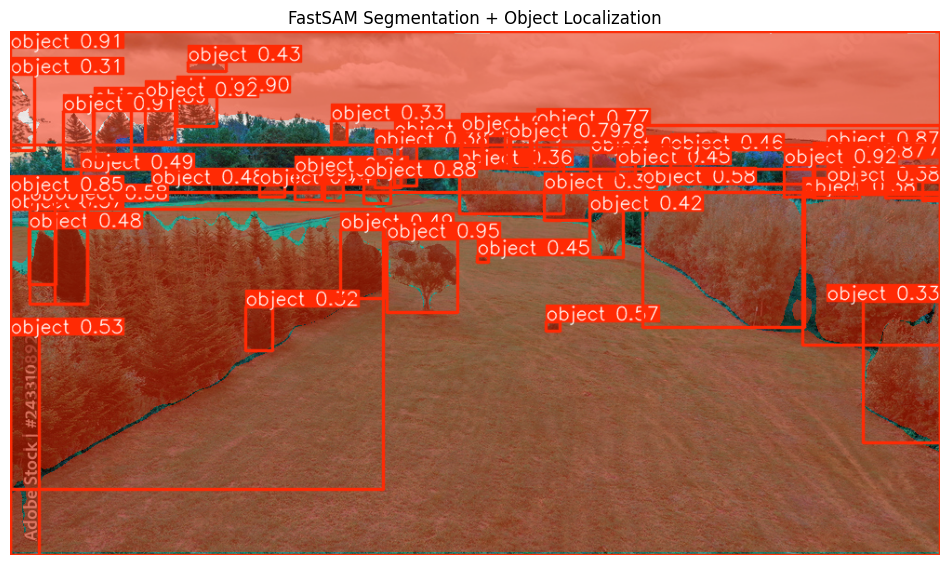

In [40]:
import numpy as np

# Get first image result
r = results[0]

# Draw combined mask and boxes
seg_img = r.plot()  # mask + boxes on image
plt.figure(figsize=(12, 12))
plt.imshow(seg_img)
plt.axis("off")
plt.title("FastSAM Segmentation + Object Localization")
plt.show()


Number of masks: 47


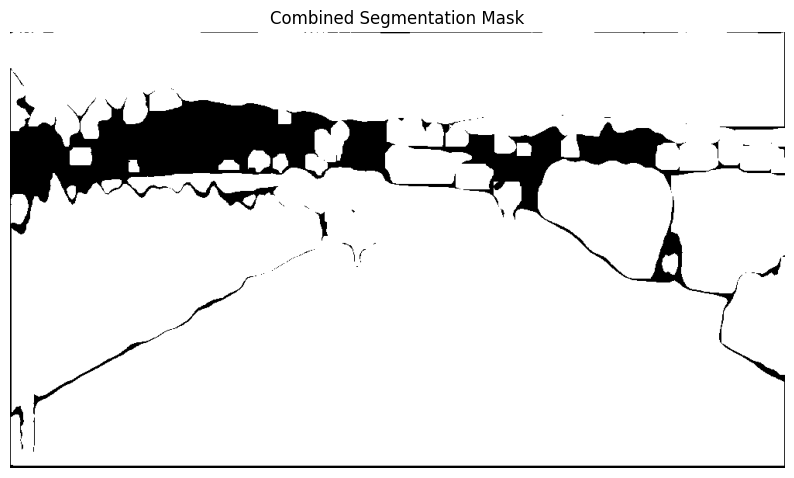

In [41]:
masks = results[0].masks.data  # shape: [num_instances, H, W]
print("Number of masks:", masks.shape[0])

import matplotlib.pyplot as plt
import torch

masks = results[0].masks.data  # [N, H, W]

# Combine masks into one
combined_mask = torch.any(masks, dim=0).cpu().numpy()

plt.figure(figsize=(10, 10))
plt.imshow(combined_mask, cmap='gray')
plt.axis('off')
plt.title("Combined Segmentation Mask")
plt.show()



image 1/1 /content/ex2.jpg: 576x1024 23 objects, 7945.9ms
Speed: 7.9ms preprocess, 7945.9ms inference, 319.2ms postprocess per image at shape (1, 3, 576, 1024)


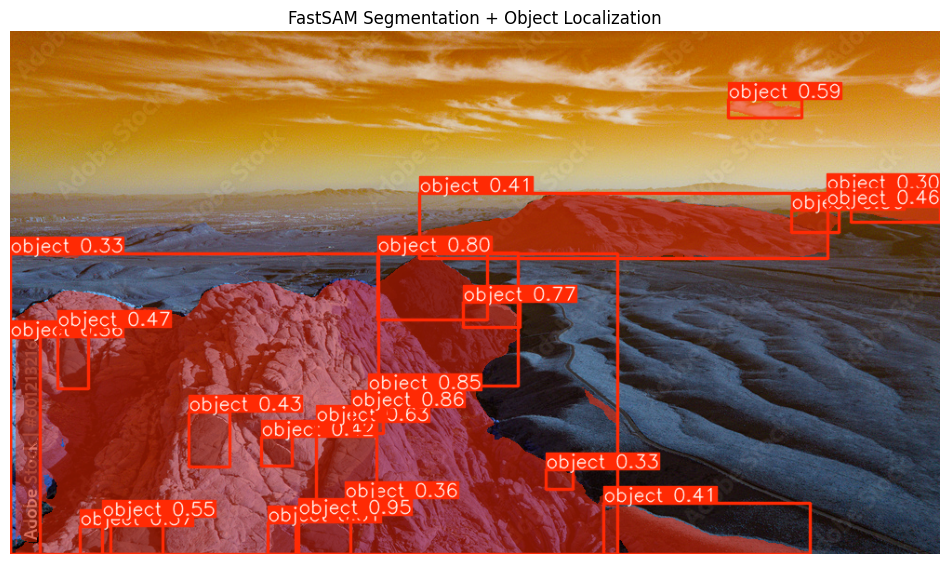

In [42]:
# Run prediction
results = model.predict(
    source='/content/ex2.jpg',
    imgsz=1024,
    retina_masks=True,
    conf=0.3,
    iou=0.7,
    device='cuda' if torch.cuda.is_available() else 'cpu')

import numpy as np

# Get first image result
r = results[0]

# Draw combined mask and boxes
seg_img = r.plot()  # mask + boxes on image
plt.figure(figsize=(12, 12))
plt.imshow(seg_img)
plt.axis("off")
plt.title("FastSAM Segmentation + Object Localization")
plt.show()


Number of masks: 23


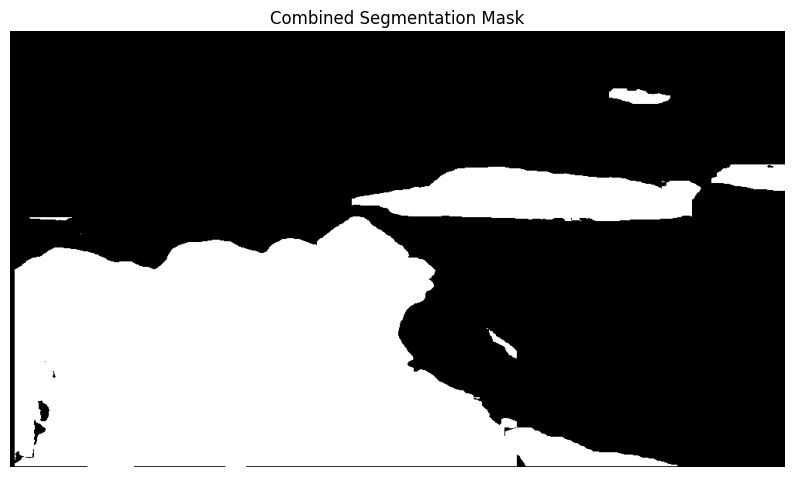

In [43]:
masks = results[0].masks.data  # shape: [num_instances, H, W]
print("Number of masks:", masks.shape[0])

import matplotlib.pyplot as plt
import torch

masks = results[0].masks.data  # [N, H, W]

# Combine masks into one
combined_mask = torch.any(masks, dim=0).cpu().numpy()

plt.figure(figsize=(10, 10))
plt.imshow(combined_mask, cmap='gray')
plt.axis('off')
plt.title("Combined Segmentation Mask")
plt.show()


image 1/1 /content/ex3.jpg: 608x1024 33 objects, 10381.6ms
Speed: 5.7ms preprocess, 10381.6ms inference, 408.6ms postprocess per image at shape (1, 3, 608, 1024)


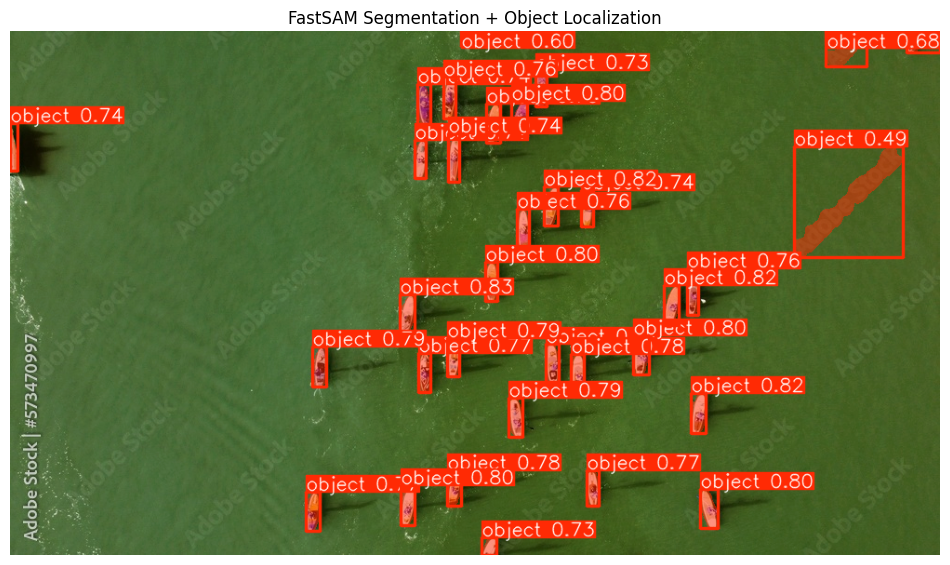

In [44]:
# Run prediction
results = model.predict(
    source='/content/ex3.jpg',
    imgsz=1024,
    retina_masks=True,
    conf=0.4,
    iou=0.9,
    device='cuda' if torch.cuda.is_available() else 'cpu')

import numpy as np

# Get first image result
r = results[0]

# Draw combined mask and boxes
seg_img = r.plot()  # mask + boxes on image
plt.figure(figsize=(12, 12))
plt.imshow(seg_img)
plt.axis("off")
plt.title("FastSAM Segmentation + Object Localization")
plt.show()


Number of masks: 33


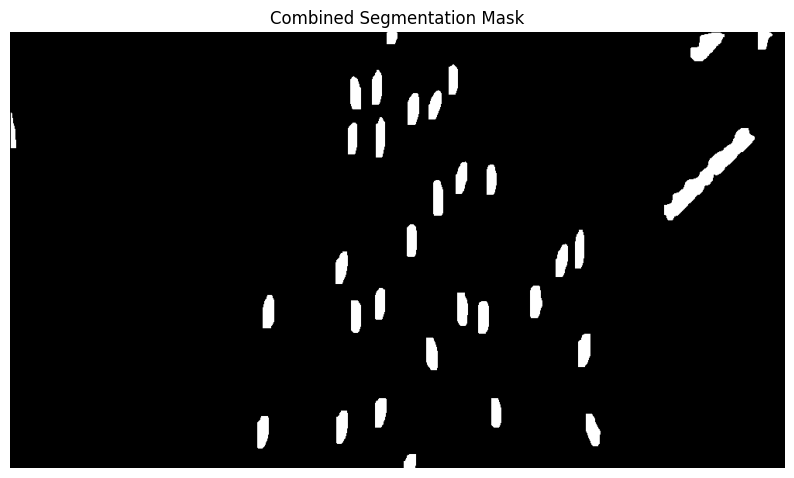

In [45]:
masks = results[0].masks.data  # shape: [num_instances, H, W]
print("Number of masks:", masks.shape[0])

import matplotlib.pyplot as plt
import torch

masks = results[0].masks.data  # [N, H, W]

# Combine masks into one
combined_mask = torch.any(masks, dim=0).cpu().numpy()

plt.figure(figsize=(10, 10))
plt.imshow(combined_mask, cmap='gray')
plt.axis('off')
plt.title("Combined Segmentation Mask")
plt.show()


image 1/1 /content/ex4.jpg: 768x1024 35 objects, 1513.2ms
Speed: 7.5ms preprocess, 1513.2ms inference, 599.0ms postprocess per image at shape (1, 3, 768, 1024)


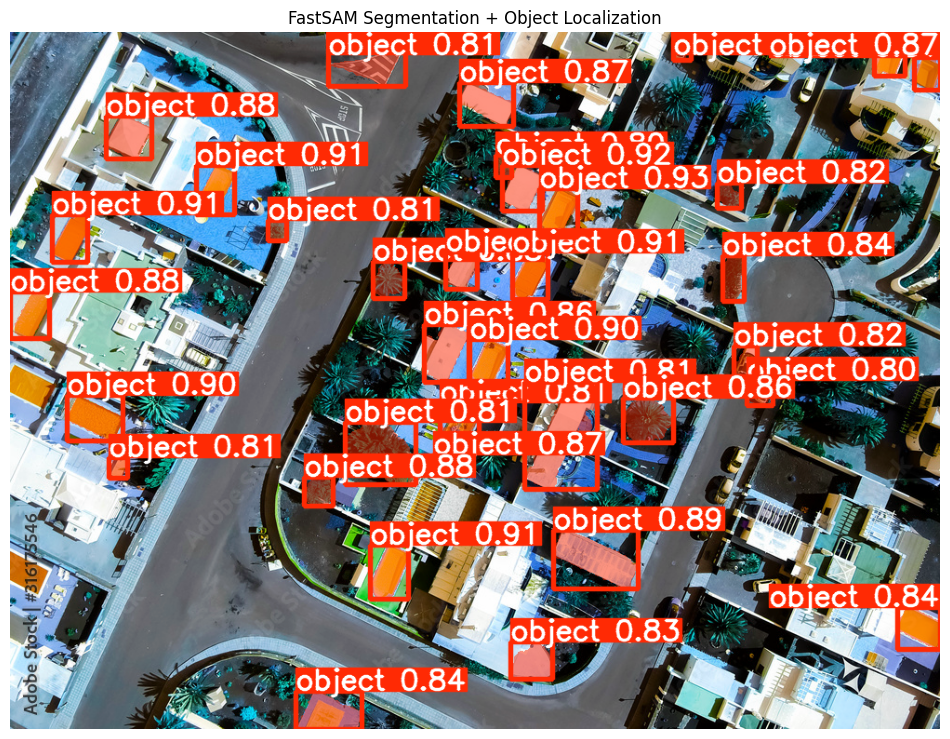

In [34]:
# Run prediction
results = model.predict(
    source='/content/ex4.jpg',
    imgsz=1024,
    retina_masks=True,
    conf=0.8,
    iou=0.9,
    device='cuda' if torch.cuda.is_available() else 'cpu')

import numpy as np

# Get first image result
r = results[0]

# Draw combined mask and boxes
seg_img = r.plot()  # mask + boxes on image
plt.figure(figsize=(12, 12))
plt.imshow(seg_img)
plt.axis("off")
plt.title("FastSAM Segmentation + Object Localization")
plt.show()


Number of masks: 35


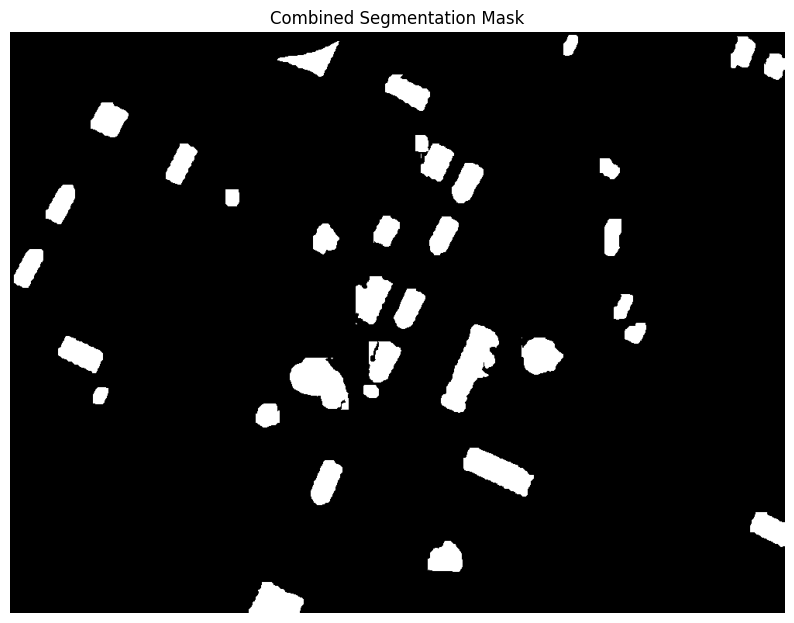

In [35]:
masks = results[0].masks.data  # shape: [num_instances, H, W]
print("Number of masks:", masks.shape[0])

import matplotlib.pyplot as plt
import torch

masks = results[0].masks.data  # [N, H, W]

# Combine masks into one
combined_mask = torch.any(masks, dim=0).cpu().numpy()

plt.figure(figsize=(10, 10))
plt.imshow(combined_mask, cmap='gray')
plt.axis('off')
plt.title("Combined Segmentation Mask")
plt.show()


image 1/1 /content/ex5.jpg: 608x1024 76 objects, 1095.4ms
Speed: 6.6ms preprocess, 1095.4ms inference, 986.9ms postprocess per image at shape (1, 3, 608, 1024)


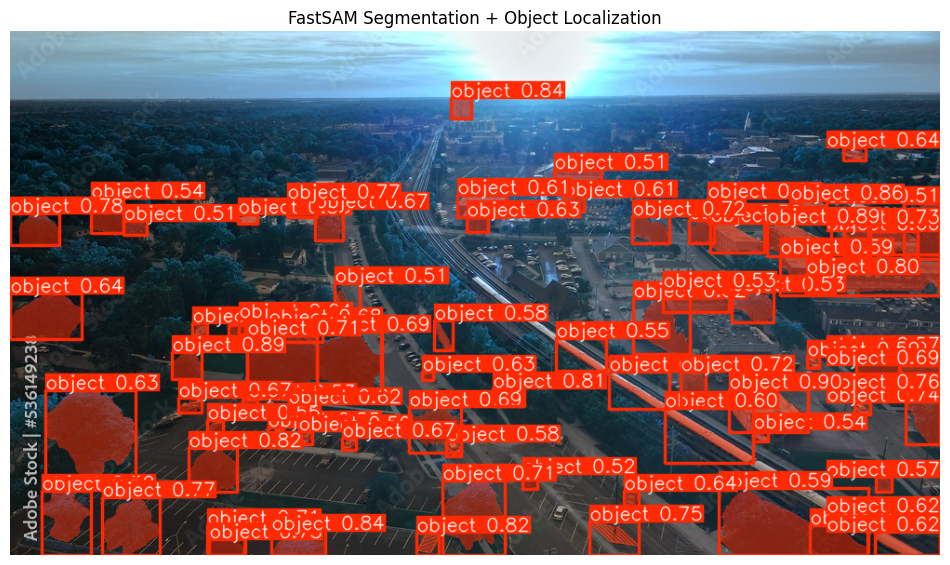

In [36]:
# Run prediction
results = model.predict(
    source='/content/ex5.jpg',
    imgsz=1024,
    retina_masks=True,
    conf=0.5,
    iou=0.6,
    device='cuda' if torch.cuda.is_available() else 'cpu')

import numpy as np

# Get first image result
r = results[0]

# Draw combined mask and boxes
seg_img = r.plot()  # mask + boxes on image
plt.figure(figsize=(12, 12))
plt.imshow(seg_img)
plt.axis("off")
plt.title("FastSAM Segmentation + Object Localization")
plt.show()


Number of masks: 76


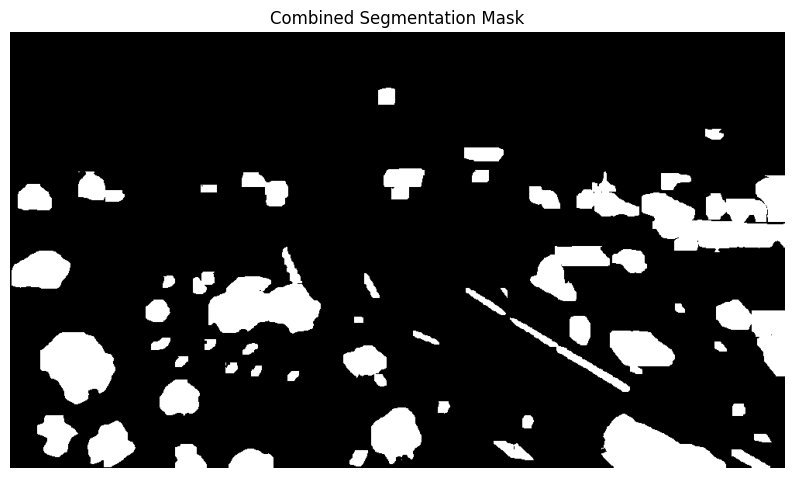

In [37]:
masks = results[0].masks.data  # shape: [num_instances, H, W]
print("Number of masks:", masks.shape[0])

import matplotlib.pyplot as plt
import torch

masks = results[0].masks.data  # [N, H, W]

# Combine masks into one
combined_mask = torch.any(masks, dim=0).cpu().numpy()

plt.figure(figsize=(10, 10))
plt.imshow(combined_mask, cmap='gray')
plt.axis('off')
plt.title("Combined Segmentation Mask")
plt.show()